# Linear Methods
* Preliminaries ---
* Linear regression ---
* Model selection ---
* Beyond least squares
  * Subset selection
  * Shrinkage
  * Derived imput directions
* Extending linear methods
* Transformation of inputs
* Piece-wise polynomials
* Gaussian basis functions
* Wavelet and Fourier basis functions



## Notation
* Capital letters, e.g., X denote variables
* Lower-case letters e.g., x, denote observations.
* Dummy index j to denotes different variables, e.g. $X_j$
* Dummy index i to denotes different observations, e.g., $x_i$
* Bolded variables are vevtor/matrices. e.g., **y,X**

## Linea Regression
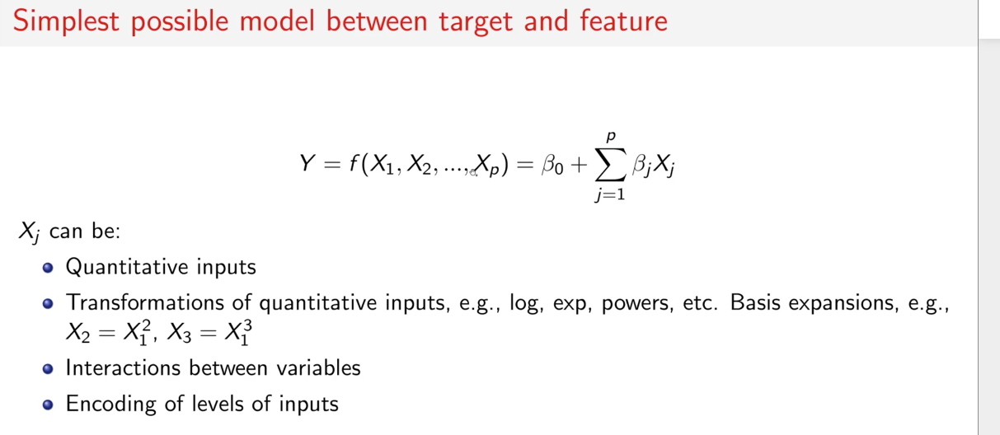


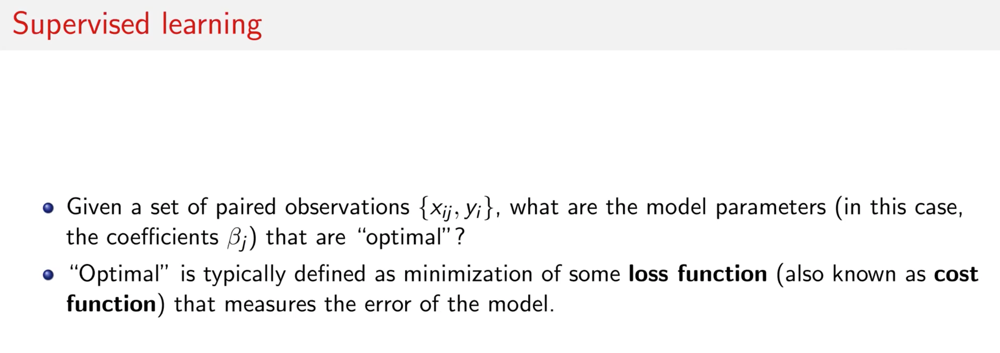

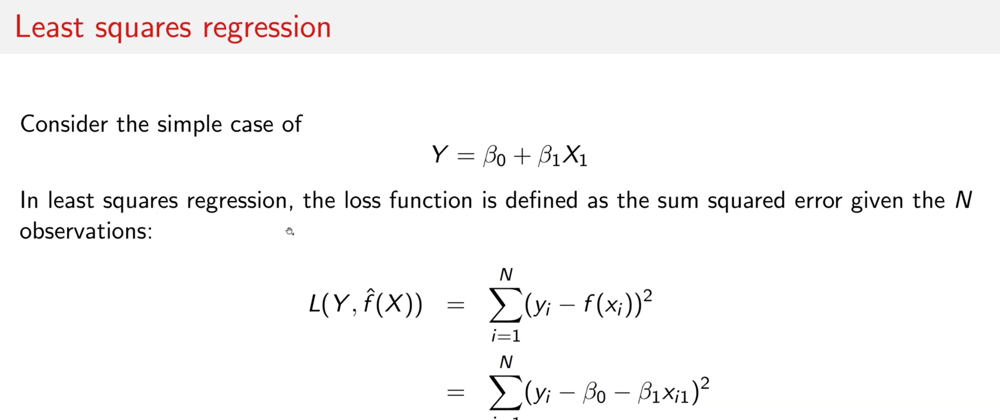

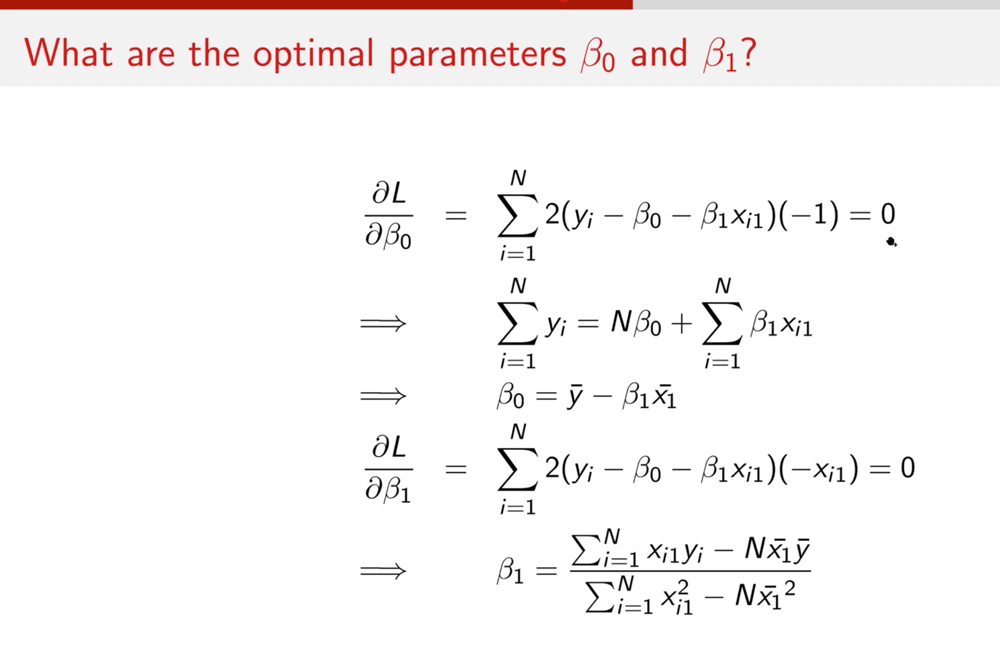

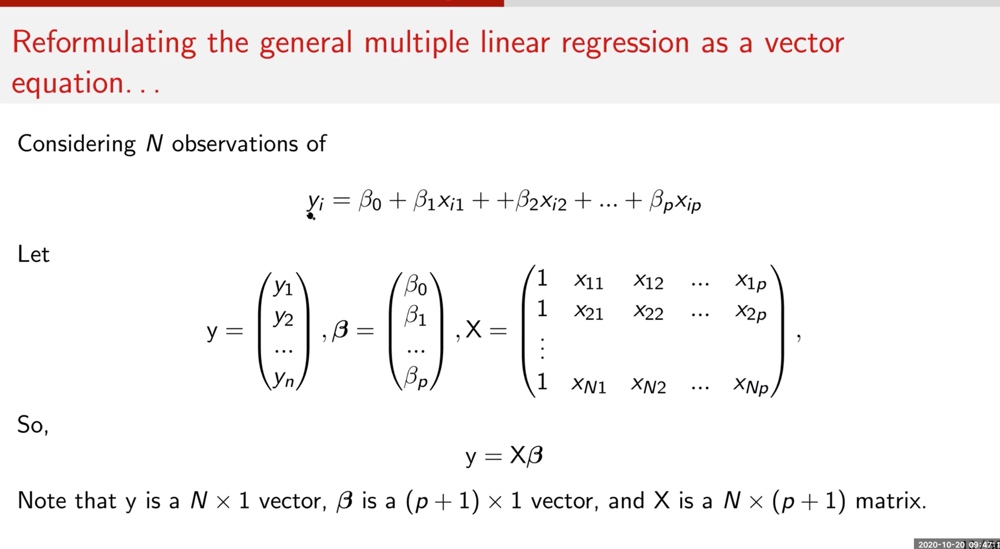


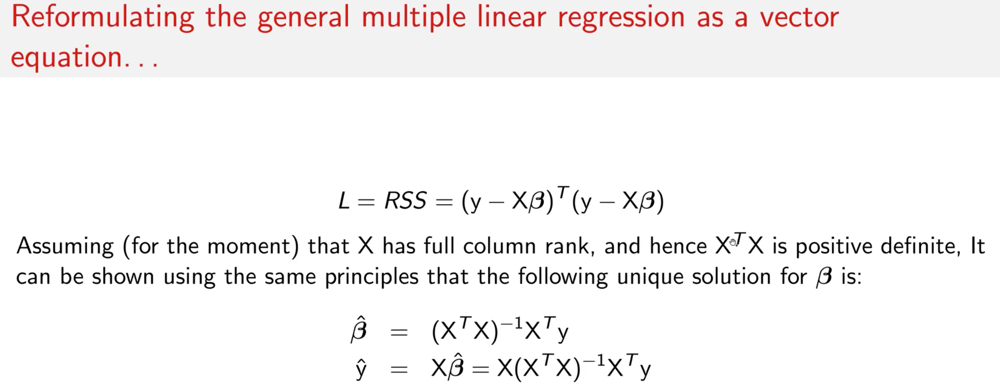
**Residual sum squares** \
需要$X^T(n*m)*X(m*n)$凑成(n*n)方阵，才有可逆矩阵

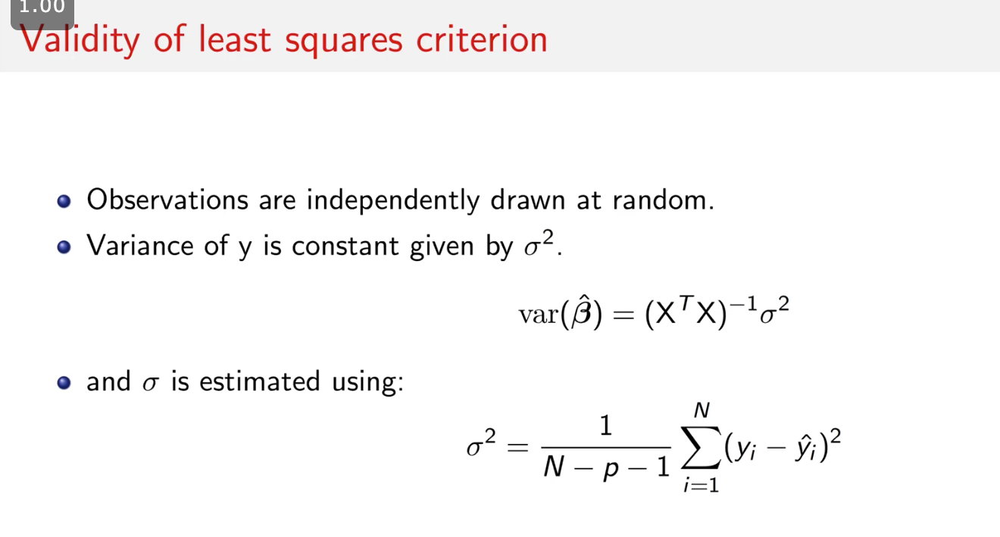

·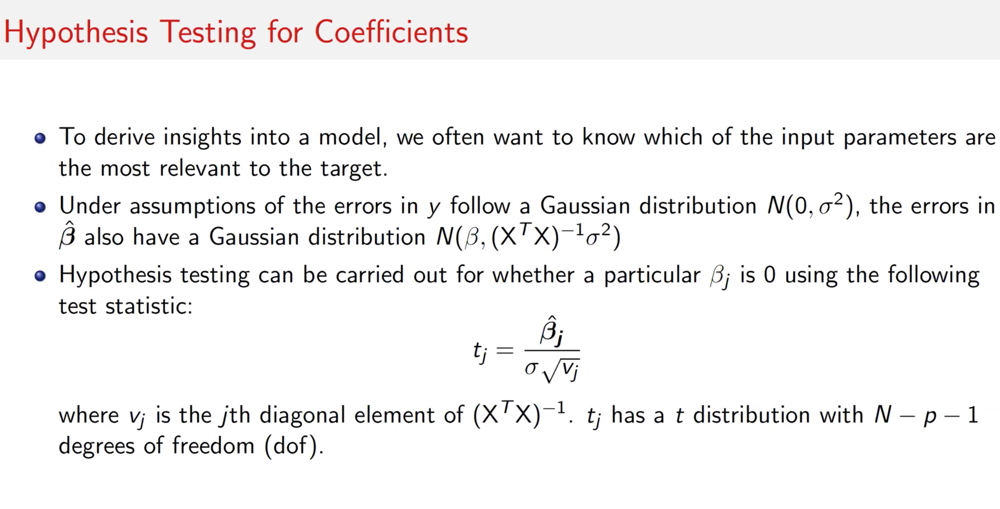

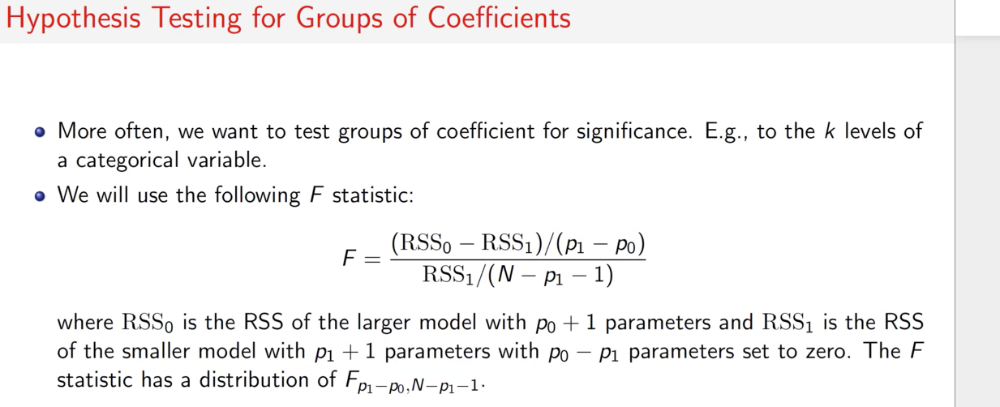

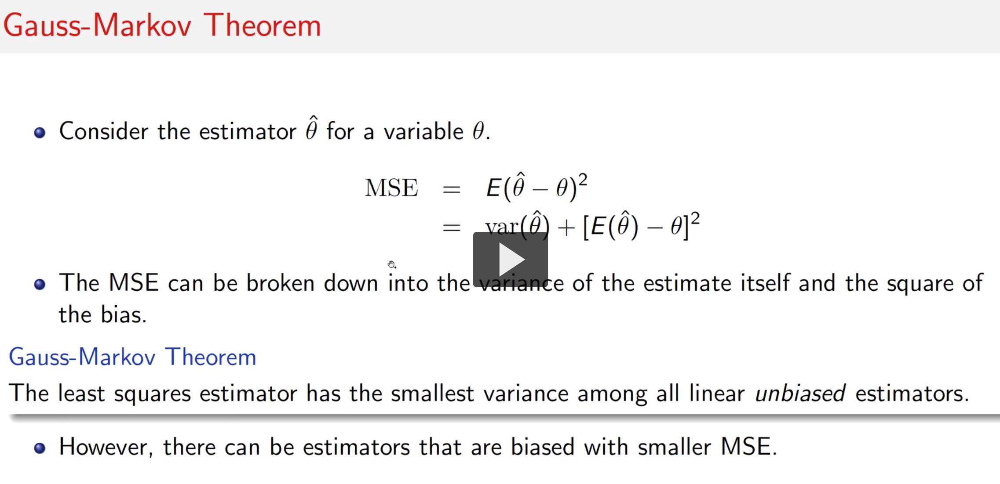

# Example materials data
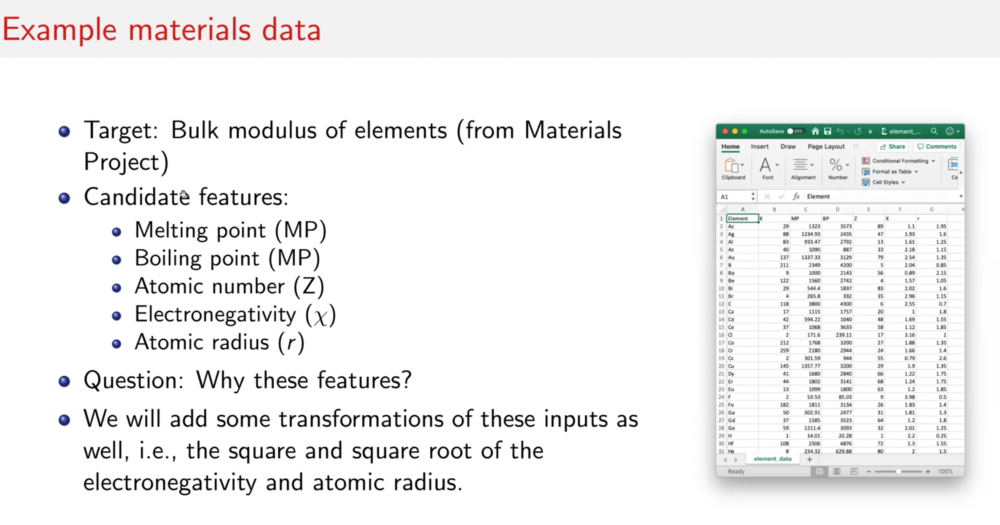

In [13]:
import pandas as pd
#Read in data and set first column as index.
data = pd.read_csv("element_data.csv", index_col = 0)
data.head()


,K,MP,BP,Z,X,r
Element,,,,,,
Ac,29.0,1323.00,3573.0,89,1.10,1.95
Ag,88.0,1234.93,2435.0,47,1.93,1.60
Al,83.0,933.47,2792.0,13,1.61,1.25
As,40.0,1090.00,887.0,33,2.18,1.15
Au,137.0,1337.33,3129.0,79,2.54,1.35


In [16]:
# Generate transformation as additional columns.
data['X^2'] = data['X'] ** 2
data['sqrt(X)'] = data['X'] ** 0.5
data['r^2'] =data['r'] ** 2
data['sqrt(r)'] = data['r'] ** 0.5
data.head()


,K,MP,BP,Z,X,r,X^2,sqrt(X),r^2,sqrt(r)
Element,,,,,,,,,,
Ac,29.0,1323.00,3573.0,89,1.10,1.95,1.2100,1.048809,3.8025,1.396424
Ag,88.0,1234.93,2435.0,47,1.93,1.60,3.7249,1.389244,2.5600,1.264911
Al,83.0,933.47,2792.0,13,1.61,1.25,2.5921,1.268858,1.5625,1.118034
As,40.0,1090.00,887.0,33,2.18,1.15,4.7524,1.476482,1.3225,1.072381
Au,137.0,1337.33,3129.0,79,2.54,1.35,6.4516,1.593738,1.8225,1.161895


In [20]:
# Define our feature, which is all the columns
# excluding K, which is the target
features = [c for c in data.columns if c != 'K'] # feature column names
x =  data[features]
y = data['K'] # target

# alternatively method for the condition selection in [] is:
# features - list(data.column)
# features.pop(0) # delete the first column name K from the list
# print(features)
x.head()

,MP,BP,Z,X,r,X^2,sqrt(X),r^2,sqrt(r)
Element,,,,,,,,,
Ac,1323.00,3573.0,89,1.10,1.95,1.2100,1.048809,3.8025,1.396424
Ag,1234.93,2435.0,47,1.93,1.60,3.7249,1.389244,2.5600,1.264911
Al,933.47,2792.0,13,1.61,1.25,2.5921,1.268858,1.5625,1.118034
As,1090.00,887.0,33,2.18,1.15,4.7524,1.476482,1.3225,1.072381
Au,1337.33,3129.0,79,2.54,1.35,6.4516,1.593738,1.8225,1.161895


In [22]:
# MLR in scikit-learn
from sklearn import linear_model

model = linear_model.LinearRegression()


In [23]:
model.fit(x,y)

LinearRegression()

In [25]:
print(model.coef_)
print(model.intercept_)

[ 4.24593389e-02  2.76250528e-02 -2.47598243e-01  3.92032157e+02
 -3.55139176e+02 -4.95560226e+01 -3.85039953e+02  5.40312522e+01
  4.99844526e+02]
-243.8440890677647


In [27]:
model.predict([[1323.00, 3573.0, 89, 1.10, 1.95, 1.2100, 1.048809, 3.8025, 1.396424]])

array([67.36423794])

In [28]:
y_pred = model.predict(x)
print(y_pred)

[ 67.36429859 103.692539    83.20050665  68.45446812 142.01085064
 212.24949413   9.48574423 106.89769424  54.27550517  30.79435145
 293.46582619  10.9420502   20.32266469  64.70510223  24.08779609
 146.66942835 142.36102109 -34.16765006 130.04958178  74.04009061
  88.97074416  22.00945209 -44.92051698 143.90785005  58.52075239
  88.64105885 126.34032908 -26.90912132 167.95650772   6.05266421
  81.27869194  36.41050968  55.79358965 234.56632727 -44.67985195
  74.4639873  -24.73982786 111.07597821  18.89188688  88.28961318
 254.64473526  16.67285924 -42.05385308 215.25060638  68.72910488
 146.26753363  87.49345439   0.56107153 274.76280683  30.91235422
  80.297012   163.42233562  67.95759768  69.45826856 191.35184564
  58.59128309 -43.656637   281.60816507 204.23637749 229.19407725
  50.36415972  77.939737   108.52934695  56.83156578 146.16172338
  37.39477827  84.13748058   2.19822426 241.60453351  78.64742951
 209.07170391  55.67965357 157.66954057 139.97838303  33.07076767
  65.00366

In [29]:
from sklearn import metrics

In [31]:
metrics.mean_squared_error(y, y_pred)

3151.255118730958

In [42]:
# code of class 5
equation = ["%.2e %s" % (v, f) for v, f in zip(model.coef_, features)]
print("K = %.1f + %s" % (model.intercept_, "+".join(equation)))

K = -243.8 + 4.25e-02 MP+2.76e-02 BP+-2.48e-01 Z+3.92e+02 X+-3.55e+02 r+-4.96e+01 X^2+-3.85e+02 sqrt(X)+5.40e+01 r^2+5.00e+02 sqrt(r)


/opt/anaconda3/envs/nano281/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


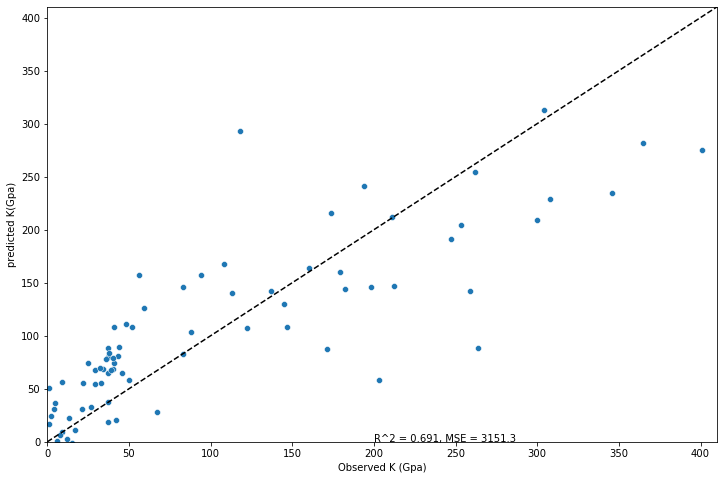

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns

f, ax = plt.subplots(figsize=(12, 8))
sns.scatterplot(y, y_pred)
plt.ylabel("predicted K(Gpa)")
plt.xlabel("Observed K (Gpa)")
plt.annotate("R^2 = %.3f, MSE = %.1f" % (model.score(x,y), metrics.mean_squared_error(y, y_pred)),(200,0), fontsize = 10)
plt.xlim([0,410])
plt.ylim([0,410])
plt.plot([0,410],[0,410],'k--')

/opt/anaconda3/envs/nano281/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


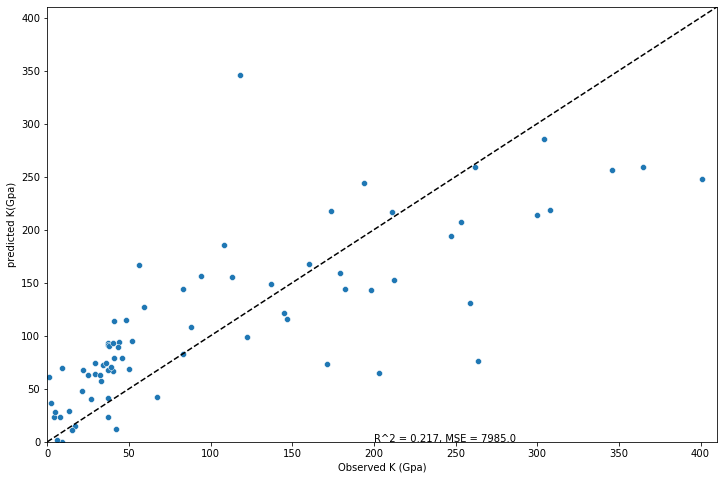

In [70]:
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.metrics import r2_score, mean_squared_error
kfold = KFold(n_splits = 5, shuffle = True, random_state = 42)

mlr = linear_model.LinearRegression()

y_pred_mlr =cross_val_predict(mlr, x, y, cv = kfold) # 5-fold cv
r2_mlr = r2_score(y, y_pred_mlr)
mse_mlr = mean_squared_error(y, y_pred_mlr)
mae_mlr_best = mean_squared_error(y, yhat_mlr_best)
label_mlr = "MLR: $R^2$ = %.3f, MSE = %.1f" % (r2_mlr, mse_mlr)

f, ax = plt.subplots(figsize=(12, 8))
sns.scatterplot(y, y_pred_mlr)
plt.ylabel("predicted K(Gpa)")
plt.xlabel("Observed K (Gpa)")
plt.annotate("R^2 = %.3f, MSE = %.1f" % (r2_mlr, mse_mlr),(200,0), fontsize = 10)
plt.xlim([0,410])
plt.ylim([0,410])
plt.plot([0,410],[0,410],'k--')

In [65]:
# selecting certain features
from sklearn.feature_selection import SelectKBest, f_regression
import numpy as np

sel = SelectKBest(f_regression, k =3)
x_new = sel.fit_transform(x,y)

def identify_columns(x_new, nrows = 10):
    columns = x.columns
    xvalues = x.values
    dist = np.linalg.norm(xvalues[:nrows,:, None] - x_new[:nrows, None, :], axis = 0 )
    return columns[np.argmin(dist, axis=0)].values
print(f"Selected features {identify_columns(x_new)}")

Selected features ['MP' 'BP' 'r^2']


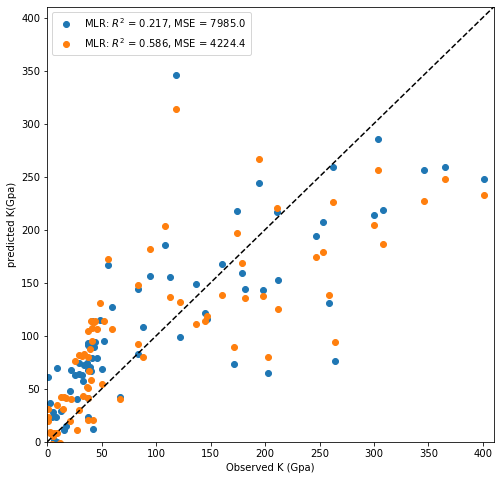

In [71]:
mlr_best = linear_model.LinearRegression()
yhat_mlr_best = cross_val_predict(mlr_best, x_new, y, cv= kfold)
r2_mlr_best = r2_score(y, yhat_mlr_best)
mae_mlr_best = mean_squared_error(y, yhat_mlr_best)
label_mlr_best = "MLR: $R^2$ = %.3f, MSE = %.1f" % (r2_mlr_best, mae_mlr_best)

f, ax = plt.subplots(figsize=(8, 8))
plt.plot(y, y_pred_mlr, 'o',label = label_mlr)
plt.plot(y, yhat_mlr_best, 'o',label = label_mlr_best)
plt.ylabel("predicted K(Gpa)")
plt.xlabel("Observed K (Gpa)")
plt.legend()
plt.xlim([0,410])
plt.ylim([0,410])
plt.plot([0,410],[0,410],'k--')

# Ridge regression

In [75]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(x)
z = scaler.transform(x)
print(x.head())
print(z)

              MP      BP   Z     X     r     X^2   sqrt(X)     r^2   sqrt(r)
Element                                                                     
Ac       1323.00  3573.0  89  1.10  1.95  1.2100  1.048809  3.8025  1.396424
Ag       1234.93  2435.0  47  1.93  1.60  3.7249  1.389244  2.5600  1.264911
Al        933.47  2792.0  13  1.61  1.25  2.5921  1.268858  1.5625  1.118034
As       1090.00   887.0  33  2.18  1.15  4.7524  1.476482  1.3225  1.072381
Au       1337.33  3129.0  79  2.54  1.35  6.4516  1.593738  1.8225  1.161895
[[-5.45729916e-02  5.57123559e-01  1.66453606e+00 -1.01314280e+00
   1.16750935e+00 -8.45383000e-01 -1.07372749e+00  1.24644832e+00
   1.06854639e+00]
 [-1.51727935e-01 -1.96804156e-01  3.59722921e-02  2.98800949e-01
   2.77321774e-01  1.11781464e-01  3.88706123e-01  1.59586908e-01
   3.21590936e-01]
 [-4.84285326e-01  3.97091957e-02 -1.28238886e+00 -2.07008688e-01
  -6.12865800e-01 -3.19359299e-01 -1.28447494e-01 -7.12963799e-01
  -5.12628364e-01]
 [-3.116

In [76]:
cv_results = []
coeffs = []
alphas = np.logspace(-2, 2, 71)
print(alphas)


[1.00000000e-02 1.14062492e-02 1.30102522e-02 1.48398179e-02
 1.69266662e-02 1.93069773e-02 2.20220195e-02 2.51188643e-02
 2.86512027e-02 3.26802759e-02 3.72759372e-02 4.25178630e-02
 4.84969343e-02 5.53168120e-02 6.30957344e-02 7.19685673e-02
 8.20891416e-02 9.36329209e-02 1.06800043e-01 1.21818791e-01
 1.38949549e-01 1.58489319e-01 1.80776868e-01 2.06198601e-01
 2.35195264e-01 2.68269580e-01 3.05994969e-01 3.49025488e-01
 3.98107171e-01 4.54090961e-01 5.17947468e-01 5.90783791e-01
 6.73862717e-01 7.68624610e-01 8.76712387e-01 1.00000000e+00
 1.14062492e+00 1.30102522e+00 1.48398179e+00 1.69266662e+00
 1.93069773e+00 2.20220195e+00 2.51188643e+00 2.86512027e+00
 3.26802759e+00 3.72759372e+00 4.25178630e+00 4.84969343e+00
 5.53168120e+00 6.30957344e+00 7.19685673e+00 8.20891416e+00
 9.36329209e+00 1.06800043e+01 1.21818791e+01 1.38949549e+01
 1.58489319e+01 1.80776868e+01 2.06198601e+01 2.35195264e+01
 2.68269580e+01 3.05994969e+01 3.49025488e+01 3.98107171e+01
 4.54090961e+01 5.179474

In [81]:
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

for alpha in alphas:
    ridge = linear_model.Ridge(alpha = alpha, max_iter=10000)
    ridge.fit(z,y)
    scores = cross_validate(ridge,z,y, cv=kfold, scoring="neg_mean_squared_error")
    cv_results.append([alpha, -np.mean(scores["test_score"])]+list(ridge.coef_))

In [82]:
cv_results = pd.DataFrame(cv_results, columns=["alpha", "score"]+features)
cv_results.head()

,alpha,score,MP,BP,Z,X,r,X^2,sqrt(X),r^2,sqrt(r)
0,0.010000,4821.649556,39.274210,41.005236,-7.654501,129.985697,-110.882144,-92.915760,-5.249711,54.004603,69.675357
1,0.011406,4740.157203,39.332608,40.967185,-7.763806,123.277708,-107.087411,-90.748610,-0.445680,52.725301,67.337748
2,0.013010,4667.038216,39.392297,40.929958,-7.876995,116.699923,-102.999092,-88.613197,4.263834,51.326887,64.826034
3,0.014840,4601.723816,39.452963,40.893737,-7.993295,110.294530,-98.638363,-86.522152,8.847473,49.815716,62.153626
4,0.016927,4543.608912,39.514274,40.858656,-8.111799,104.098509,-94.034362,-84.486488,13.277338,48.201261,59.338727


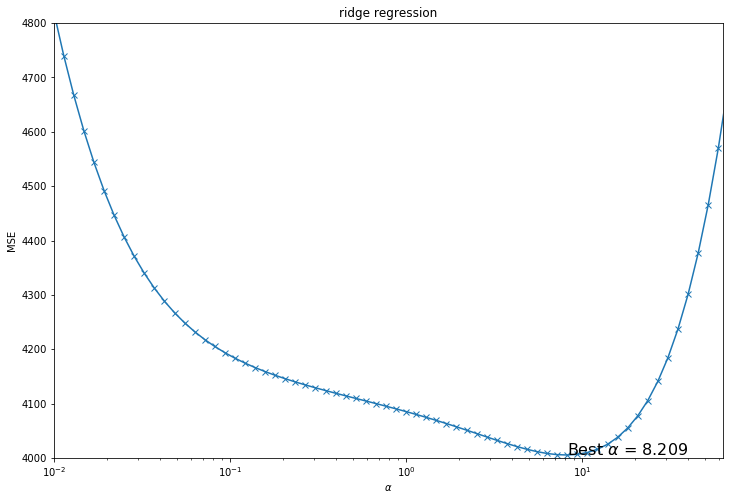

In [95]:
f, ax = plt.subplots(figsize=(12, 8))
plt.plot(cv_results["alpha"], cv_results["score"],'-x')
plt.xlim([1e-2,10**1.8])
plt.ylim([4000,4800])
plt.xscale(r'log')
plt.xlabel(r"$\alpha$")
plt.ylabel(r"MSE")
plt.title(r"ridge regression")
best_alpha = cv_results["alpha"][cv_results["score"].idxmin()]
plt.annotate(r"Best $\alpha$ = %.3f" % best_alpha,(best_alpha, cv_results["score"].min()), fontsize=16);

(-100, 100)

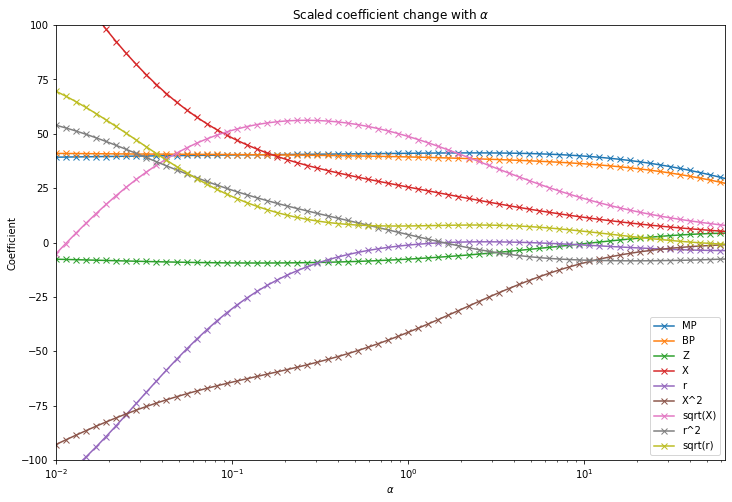

In [99]:
f, ax = plt.subplots(figsize=(12,8))
for f in features:
    plt.plot(cv_results["alpha"],cv_results[f],'-x',label = f)
    plt.xscale(r'log')
    plt.xlabel(r"$\alpha$")
    plt.ylabel("Coefficient")
    plt.title(r"Scaled coefficient change with $\alpha$")
plt.legend()
plt.xlim([1e-2,10**1.8])
plt.ylim([-100,100])

In [116]:
reg = linear_model.Ridge(alpha=best_alpha, max_iter=10000)
reg.fit(z,y)
means_ = scaler.mean_
stds_ = scaler.scale_

real_coef = reg.coef_ / stds_  # convert back to unnormalized inputs
real_interp = reg.intercept_ - means_.dot(real_coef) # convert back to unnomalized inputs

equation = ["%.2e %s" % (v, f) for v, f in zip(real_coef, features) if abs(v) > 1e-4]
print("k = %.1f + %s" % (real_interp, "+".join(equation)))

k = -279.9 + 4.54e-02 MP+2.53e-02 BP+-1.71e-01 Z+2.78e+01 X+7.65e-01 r+-8.64e+00 X^2+1.43e+02 sqrt(X)+-4.29e+00 r^2+4.50e+01 sqrt(r)


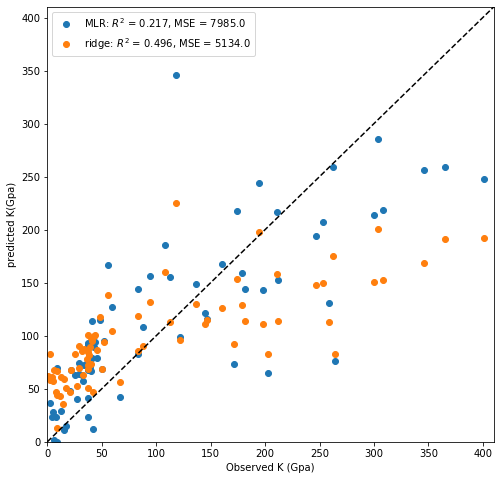

In [101]:
reg = linear_model.Ridge(alpha=best_alpha, max_iter=10000)
yhat_ridge = cross_val_predict(ridge, z, y, cv=kfold)
r2_ridge = r2_score(y, yhat_ridge)
mae_ridge = mean_squared_error(y, yhat_ridge)
label_ridge = "ridge: $R^2$ = %.3f, MSE = %.1f" %(r2_ridge, mae_ridge)

f, ax = plt.subplots(figsize=(8, 8))
plt.plot(y, y_pred_mlr, 'o',label = label_mlr)
plt.plot(y, yhat_ridge, 'o',label = label_ridge)
plt.ylabel("predicted K(Gpa)")
plt.xlabel("Observed K (Gpa)")
plt.legend()
plt.xlim([0,410])
plt.ylim([0,410])
plt.plot([0,410],[0,410],'k--')

# LASSO

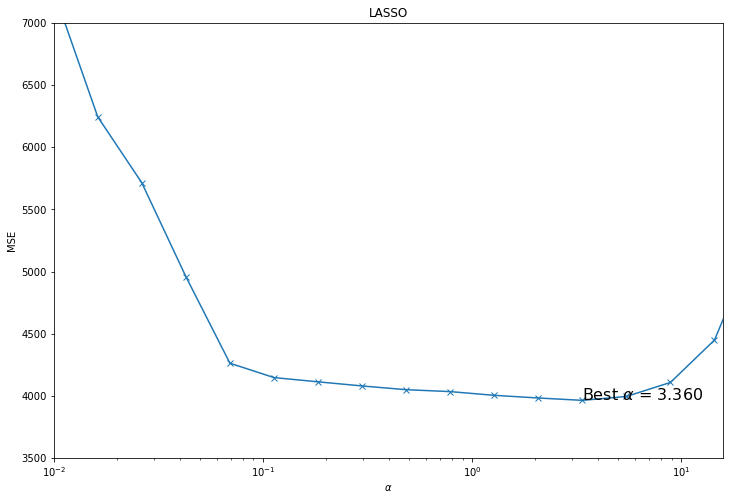

In [110]:
cv_results = []
alphas= np.logspace(-2, 2, 20)

for alpha in alphas:
    lasso = linear_model.Lasso(alpha = alpha, max_iter=100000) # iteration should be enough
    lasso.fit(z,y)
    scores = cross_validate(lasso,z,y, cv=kfold, scoring="neg_mean_squared_error")
    cv_results.append([alpha, -np.mean(scores["test_score"])]+list(lasso.coef_))

cv_results = pd.DataFrame(cv_results, columns=["alpha","score"] + features)
    
f, ax = plt.subplots(figsize=(12, 8))
plt.plot(cv_results["alpha"], cv_results["score"],'-x')
plt.xlim([1e-2,10**1.2])
plt.ylim([3500,7000])
plt.xscale(r'log')
plt.xlabel(r"$\alpha$")
plt.ylabel(r"MSE")
plt.title(r"LASSO")
best_alpha = cv_results["alpha"][cv_results["score"].idxmin()]
plt.annotate(r"Best $\alpha$ = %.3f" % best_alpha,(best_alpha, cv_results["score"].min()), fontsize=16);

(-100, 100)

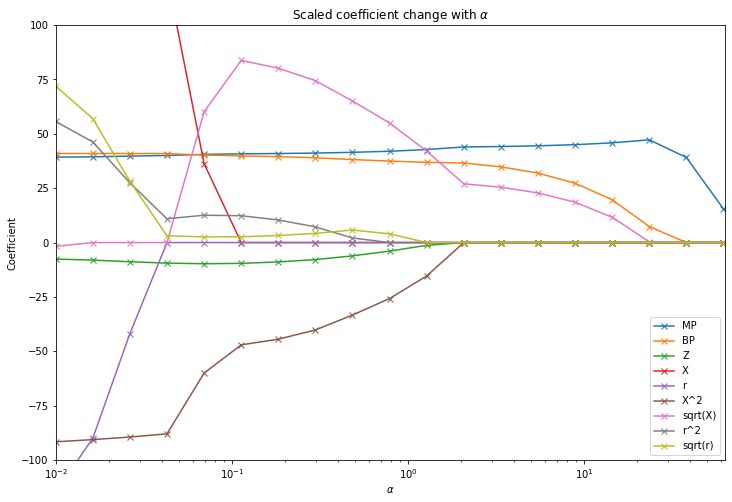

In [111]:
# the coefficient in Ridge will be smooth and near to zero but won't be zero
# LASSO is very useful to select essential parameters since it will tell you some coefficient will become 0
f, ax = plt.subplots(figsize=(12,8))
for f in features:
    plt.plot(cv_results["alpha"],cv_results[f],'-x',label = f)
    plt.xscale(r'log')
    plt.xlabel(r"$\alpha$")
    plt.ylabel("Coefficient")
    plt.title(r"Scaled coefficient change with $\alpha$")
plt.legend()
plt.xlim([1e-2,10**1.8])
plt.ylim([-100,100])

In [117]:
reg = linear_model.Lasso(alpha=best_alpha, max_iter=100000)
reg.fit(z,y)

real_coef = reg.coef_ / stds_  # convert back to unnormalized inputs
real_interp = reg.intercept_ - means_.dot(real_coef) # convert back to unnomalized inputs

equation = ["%.2e %s" % (v, f) for v, f in zip(real_coef, features) if abs(v) > 1e-4]
print("k = %.1f + %s" % (real_interp, "+".join(equation)))

k = -178.1 + 4.87e-02 MP+2.31e-02 BP+1.09e+02 sqrt(X)


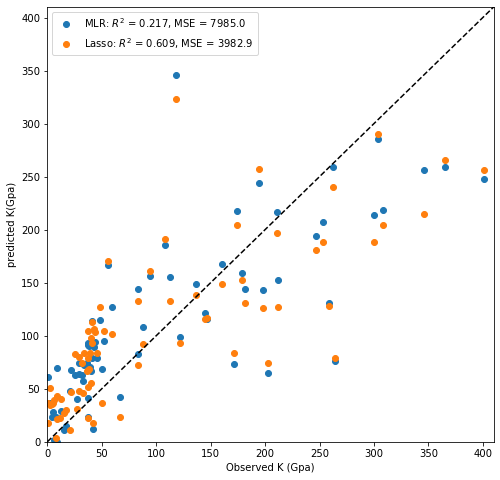

In [121]:
lasso = linear_model.Lasso(alpha=best_alpha, max_iter=10000)
yhat_lasso = cross_val_predict(lasso, z, y, cv=kfold)
r2_lasso = r2_score(y, yhat_lasso)
mse_lasso = mean_squared_error(y, yhat_lasso)
label_lasso = "Lasso: $R^2$ = %.3f, MSE = %.1f" %(r2_lasso, mse_lasso)

f, ax = plt.subplots(figsize=(8, 8))
plt.plot(y, y_pred_mlr, 'o',label = label_mlr)
plt.plot(y, yhat_lasso, 'o',label = label_lasso)
plt.ylabel("predicted K(Gpa)")
plt.xlabel("Observed K (Gpa)")
plt.legend()
plt.xlim([0,410])
plt.ylim([0,410])
plt.plot([0,410],[0,410],'k--')

# Partial Least Squares (PLS) (Class 6)

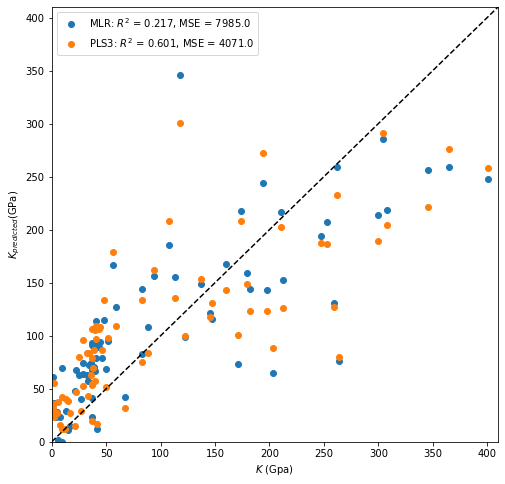

In [126]:
from sklearn.cross_decomposition import PLSRegression
cv_results = []
coeffs = []
pls = PLSRegression(n_components = 2) #instead of 9 component, just keep top 2 direction
pls.fit(x, y)
yhat_pls = cross_val_predict(pls, x, y, cv = kfold)
r2_pls = r2_score(y, yhat_pls)
mae_pls = mean_squared_error(y, yhat_pls)
label_pls = "PLS3: $R^2$ = %.3f, MSE = %.1f" %(r2_pls, mae_pls)

f, ax = plt.subplots(figsize=(8,8))
plt.plot(y, y_pred_mlr, 'o', label = label_mlr)
plt.plot(y, yhat_pls, 'o', label = label_pls)
l = plt.ylabel("$K_{predicted}$(GPa)")
l = plt.xlabel("$K$ (Gpa)")
plt.legend()
plt.xlim([0, 410])
plt.ylim([0, 410])
plt.plot([0, 410], [0,410], "k--")


# Gauss-Markov Theorem
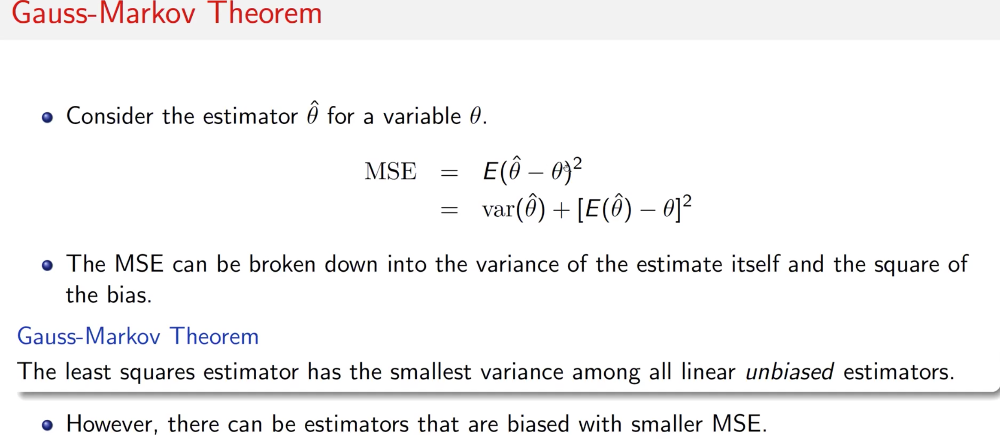

# Model seletion
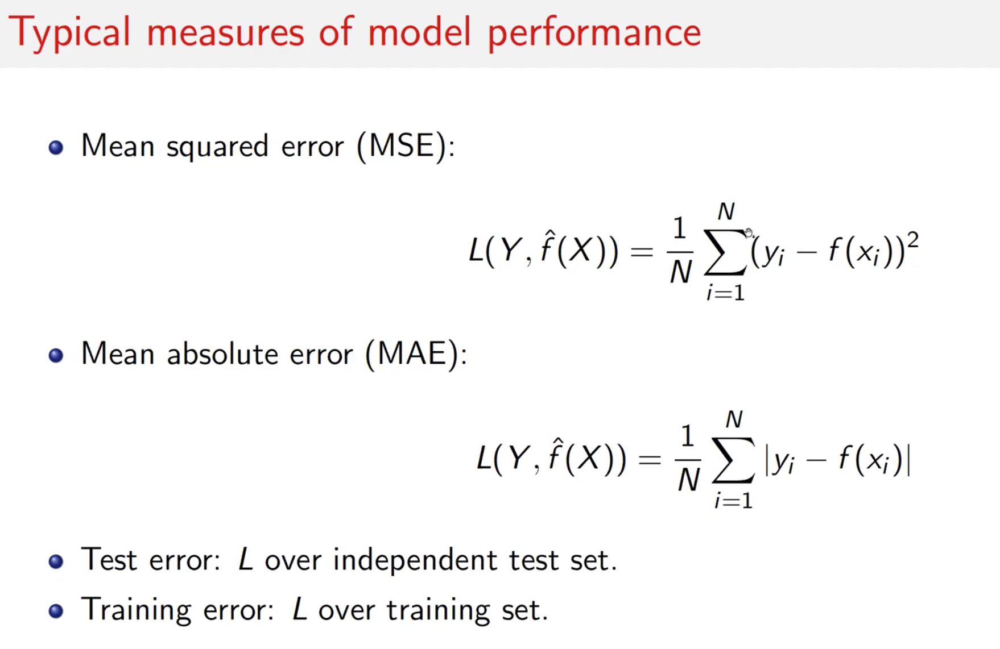

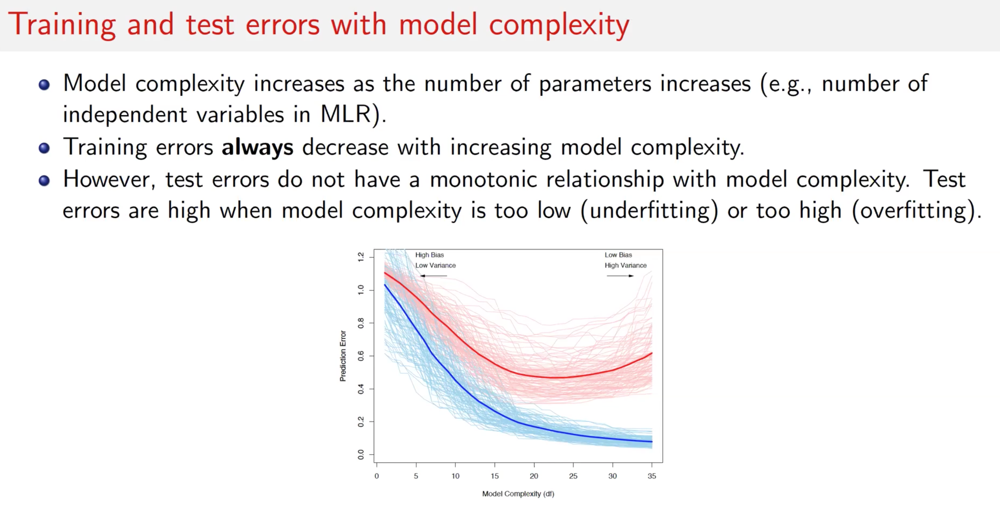

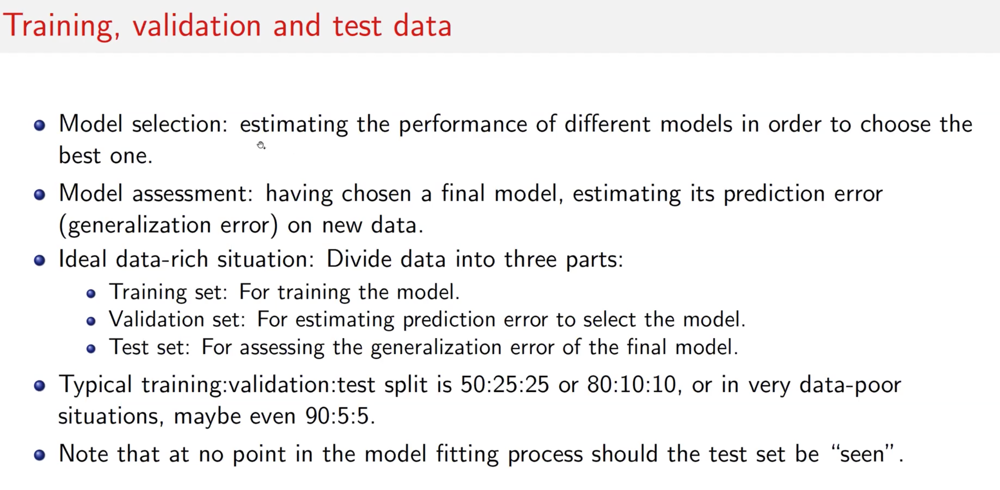

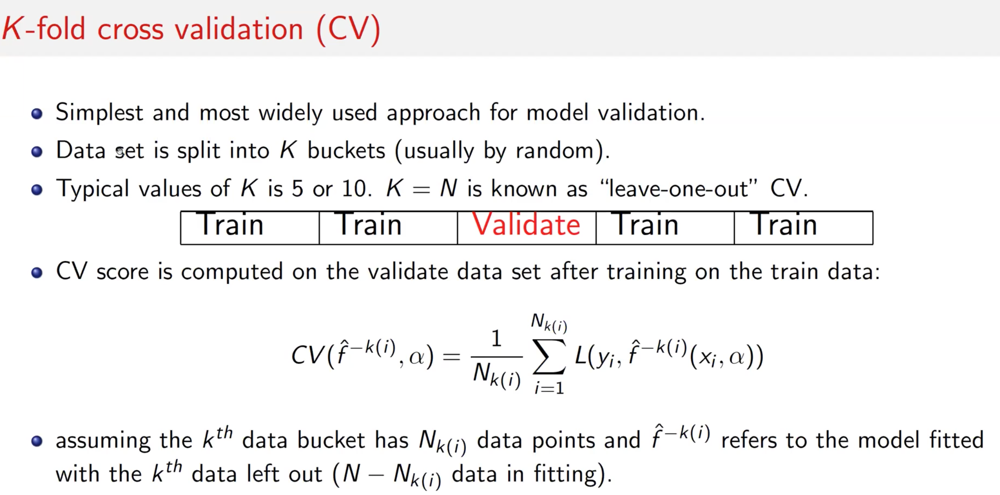

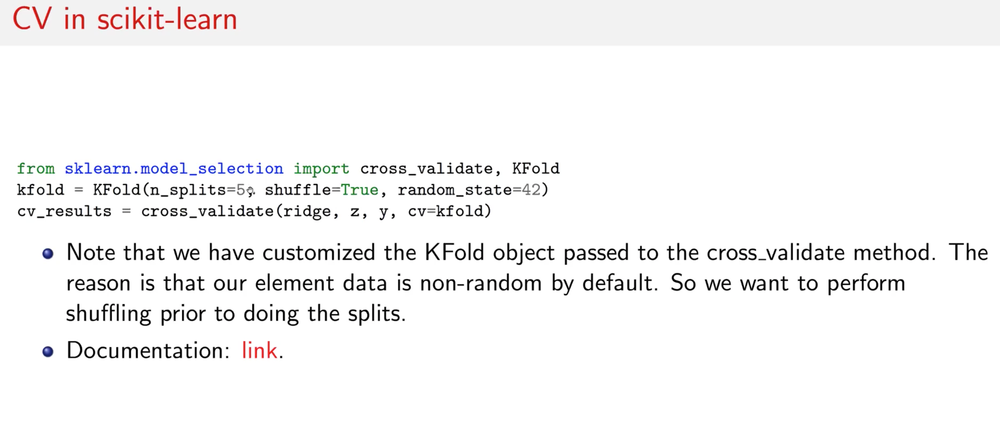

In [39]:
from sklearn.model_selection import cross_validate, KFold
kfold = KFold(n_splits = 5, shuffle = True, random_state = 42)
cv_results = cross_validate(model, x, y, cv = kfold)
cv_results

{'fit_time': array([0.003438  , 0.00429606, 0.00379109, 0.00373912, 0.00367522]),
 'score_time': array([0.00301385, 0.00286293, 0.00241995, 0.00281811, 0.00304985]),
 'test_score': array([ 0.29528146,  0.28094361,  0.72054884, -0.3593172 ,  0.64187514])}